In [1]:
from dask.array.image import imread 
import tables
import matplotlib.pyplot as plt
import pandas as pd
#import ccModules as cc
#import pathlibDB as pDB
from pathlib import Path
import numpy as np
import scipy
#graph for each plot
from bokeh.io import output_notebook, show
from bokeh.plotting import figure, output_file, show, ColumnDataSource
from bokeh.models import Range1d, LinearAxis, Legend, BoxAnnotation
from pathlib import Path
from bokeh.resources import INLINE
import bokeh.io
from dask.array.image import imread 
import sys
sys.path.append('/home/daniel/Desktop/ResearchUbuntuYoga720/A30_FastROI/CircuitCatcher2/Prairie')
import prairieModules
bokeh.io.output_notebook(INLINE) 

Loading BokehJS ...

In [2]:
def imread2(file):
    image = np.squeeze(imread(file).compute())
    if len(image.shape) >2:
        image = np.squeeze(image[-1, :, :])
    return image

In [3]:
#get folder location
img_folder = Path.cwd()
print(img_folder)

E:\A75\CurrentTest\Jihong_test\test\flya_A75-1_20190905-003


In [4]:
#get image data
ch2_tiff_P = Path(img_folder).glob('*Cycle00001*_Ch2_*.tif')
ch2_tiff = []
len1 = []
for i in ch2_tiff_P:
    ch2_tiff.append(str(i))
    len1.append(len(str(i)))
#confirm that names have the same length
print(list(set(len1)))
ch2_tiff.sort()
sample_image = np.squeeze(imread2(ch2_tiff[0]))
print(sample_image.shape)
image = np.zeros([len(ch2_tiff), 1, sample_image.shape[0], sample_image.shape[1]], dtype = sample_image.dtype)
image[0] = sample_image
for t, cim in enumerate(ch2_tiff[1:]):
    image[t+1] = np.squeeze(imread2(cim))


[113]


C:\ProgramData\Anaconda3\lib\site-packages\skimage\external\tifffile\tifffile.py:3759: RuntimeWarning: invalid value encountered in true_divide
  'z_distance': values[:, 0] / values[:, 1],


(32, 256)


C:\ProgramData\Anaconda3\lib\site-packages\skimage\external\tifffile\tifffile.py:1752: UserWarning: ome-xml: not an ome-tiff master file
  warnings.warn("ome-xml: not an ome-tiff master file")


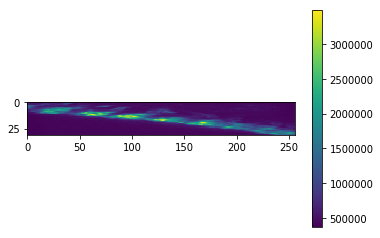

In [5]:
sum_image = np.squeeze(np.sum(image, axis=0))
plt.imshow(sum_image)
plt.colorbar()

In [6]:
#loading modules for segmentation
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import skimage
from skimage import data
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square, disk, opening, dilation, erosion, watershed, label
from skimage.color import label2rgb 
from scipy.ndimage import binary_fill_holes

from skimage.filters import try_all_threshold
from scipy import ndimage as ndi
from skimage.feature import peak_local_max

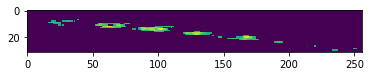

In [7]:
thresh = 2e6
thresh_sum_image = sum_image.copy()
thresh_sum_image[sum_image < thresh] = 0
plt.imshow(thresh_sum_image)

In [8]:
#remove small background bits
#selem = disk(1)
#open_image = opening(thresh_sum_image, selem)
#plt.imshow(open_image)
open_image = thresh_sum_image

In [9]:
#try watershedding to segment image
#distance = ndi.distance_transform_edt(open_image)
from skimage.filters import sobel
from skimage.feature import peak_local_max
#selem = disk(2)
#local_maxi = peak_local_max(open_image, labels=open_image, footprint=selem, indices=False)
#markers = ndi.label(local_maxi)[0]
#elevation_map = sobel(open_image)
#plt.imshow(elevation_map)
#plt.colorbar()

In [10]:
local_maxi = peak_local_max(open_image,min_distance=2)
markers = ndi.label(local_maxi)[0]

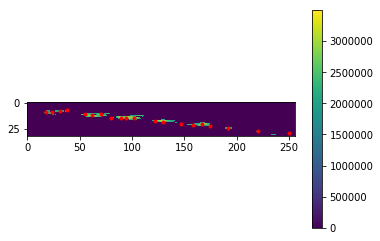

In [11]:
plt.imshow(open_image)
plt.plot(local_maxi[:, 1], local_maxi[:, 0], 'r.')
plt.colorbar()

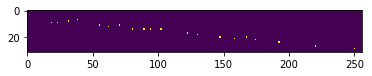

In [12]:
image_binary = np.zeros(sum_image.shape)
image_binary[local_maxi[:,0], local_maxi[:,1]] = 1
plt.imshow(image_binary)

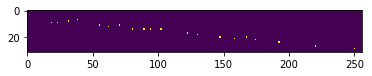

In [13]:
selem = disk(1)
close_image = closing(image_binary, selem)
plt.imshow(close_image)

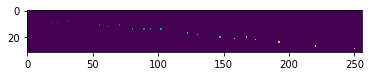

In [14]:
labeled=label(close_image)
plt.imshow(labeled)

C:\ProgramData\Anaconda3\lib\site-packages\skimage\util\arraycrop.py:175: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = np.array(ar[slices], order=order, copy=True)


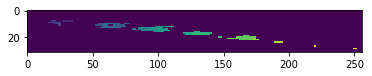

In [15]:
t= watershed(-open_image, markers = labeled, mask = open_image)
t.shape
plt.imshow(t)

In [16]:
regions = regionprops(t)


In [17]:
#generate an index for each ori from flattened image
roi_list = []
for creg in regions:
    #print(creg)
    mask = np.zeros(sum_image.shape)
    mask[creg.coords[:, 0], creg.coords[:, 1]] = 1
    mask = binary_fill_holes(mask)
    #selem = disk(3)
    #mask = erosion(mask, selem)
    #fig = plt.figure()
    #ax1 = fig.add_axes([0.1, 0.1, 0.9, 0.9])
    #ax1.imshow(mask)
    #roi_list.append(np.where(mask.flatten()))

    roi_list.append(np.where(mask.flatten()))

In [18]:
from skimage import measure

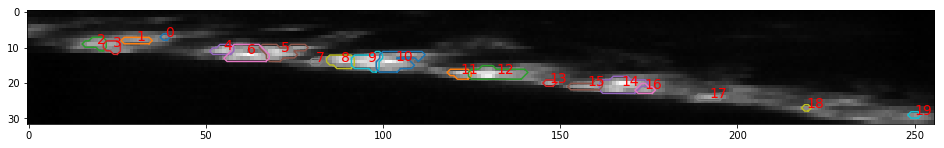

In [19]:
fig = plt.figure(figsize=(14,14))
ax1 = fig.add_axes([0.1, 0.1, 0.9, 0.9])
ax1.imshow(sum_image, cmap=plt.cm.gray)
ax1.axis('on')
for row, roi in enumerate(roi_list):
    mask = np.zeros(sum_image.shape)
    mask = mask.flatten()
    mask[roi[0]]=1
    mask = mask.reshape(sum_image.shape)
    contours = measure.find_contours(mask, 0.1)
    for contour in contours:
        ax1.plot(contour[:,1], contour[:, 0])
    #label roi
    props=regionprops(mask.astype(np.int))
    ax1.text(props[0].centroid[1], props[0].centroid[0], str(row), color='r', fontsize = 14)

In [21]:
rois = [1,2,3,4,5,6,8,9,10,11,12,14,15,16]
roi_list = [roi_list[i] for i in rois ]
#rois= roi_list

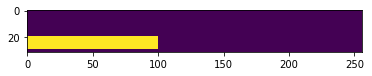

In [22]:
#create a backound roi
x = np.arange(0, 100)
y = np.arange(20, 30)
xv, yv = np.meshgrid(x, y)
mask = mask = np.zeros(sum_image.shape)
mask[yv.flatten().astype(np.int), xv.flatten().astype(np.int)] = 1
plt.imshow(mask)
roi_list.append(np.where(mask.flatten()))

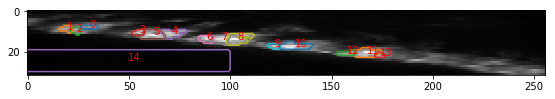

In [23]:
fig = plt.figure(figsize=(8,8))
ax1 = fig.add_axes([0.1, 0.1, 0.9, 0.9])
ax1.imshow(sum_image, cmap=plt.cm.gray)
ax1.axis('on')
for row, roi in enumerate(roi_list):
    mask = np.zeros(sum_image.shape)
    mask = mask.flatten()
    mask[roi[0]]=1
    mask = mask.reshape(sum_image.shape)
    contours = measure.find_contours(mask, 0.1)
    for contour in contours:
        ax1.plot(contour[:,1], contour[:, 0])
    #label roi
    props=regionprops(mask.astype(np.int))
    ax1.text(props[0].centroid[1], props[0].centroid[0], str(row), color='r')

In [24]:
signal = np.zeros([len(roi_list), image.shape[0]])
for ci, croi in enumerate(roi_list):
    for layer in range(image.shape[0]):
        cimage = image[layer].flatten()
        signal[ci, layer] = np.mean(cimage[croi])
signal_Back = signal.copy()
#remove background
for row in range(signal_Back.shape[0]):
    signal_Back[row, :] = signal_Back[row, :] - signal_Back[-1, :]

In [25]:
#convert data to a dataframe
df=data = pd.DataFrame(data={ 'roi_index' : roi_list, 'signal' : signal.tolist(), 'signal-back' : signal_Back.tolist()})
#rename the last roi to background
index = list(data.index)
index[-1] = 'background'
df.index = index

In [26]:
#save pandas data frame
output_pickle =  str(img_folder / str('ALL_ROI_' + img_folder.parts[-1] + '.pckl'))
df.to_pickle(output_pickle)

In [27]:
#############################################################################################################################################################
print('Start parsing the stimulation/voltage data')

Start parsing the stimulation/voltage data


In [28]:
print("Finding xml file containing time data")
xml_file = Path(img_folder).glob('*.xml')
#xml_file = [str(file) for file in xml_file if  'VoltageRecording' not in str(file)]
xml_file = [str(file) for file in xml_file if  'VoltageOutput' not in str(file)]
print(xml_file)

Finding xml file containing time data
['E:\\A75\\CurrentTest\\Jihong_test\\test\\flya_A75-1_20190905-003\\flya_A75-1_20190905-003.xml', 'E:\\A75\\CurrentTest\\Jihong_test\\test\\flya_A75-1_20190905-003\\flya_A75-1_20190905-003_Cycle00001_VoltageRecording_001.xml']


In [29]:
print('Loading roi data')
#load roi data
output_pickle =  str(img_folder / str('ALL_ROI_' + img_folder.parts[-1] + '.pckl'))
roi_signal = pd.read_pickle(output_pickle)

Loading roi data


In [30]:
print('Parsing time data')
time = prairieModules.getTime(xml_file[0])

Parsing time data


Confirming time is continuous
(3899,)


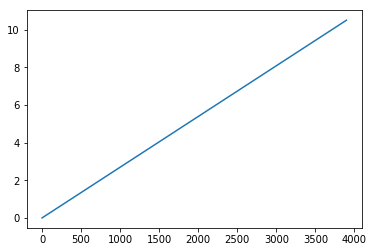

In [31]:
print('Confirming time is continuous')
time = np.array(time[0], dtype=np.float64)
plt.plot(time)
print(time.shape)

In [32]:
print('Finding file containing voltage/stimulation data')
voltage_file = Path(img_folder).glob('*.csv')
voltage_file = [str(file) for file in voltage_file if 'VoltageRecording' in str(file)]
for i in voltage_file:
    print(i)

Finding file containing voltage/stimulation data
E:\A75\CurrentTest\Jihong_test\test\flya_A75-1_20190905-003\flya_A75-1_20190905-003_Cycle00001_VoltageRecording_001.csv


In [33]:
print('Loading Voltage/Stimulation Data')
#if there are multiple cycles need to concatenate voltage measurements
voltage = pd.read_csv(voltage_file[0], index_col =0)
'''
for i in voltage_file[1:]:
    cvolt = pd.read_csv(i, index_col =0)
    cvolt.index = cvolt.index +voltage.index[-1]
    voltage = pd.concat([voltage, cvolt])
'''
voltage = voltage.rename(columns={' Input 0' : 'Input to LED Driver (V)', ' Input 7': 'Photodiode (V)'})


Loading Voltage/Stimulation Data


In [34]:
print('')
legend_it = []
plot=figure(y_range = (np.min(voltage.values), 1), x_range = (0,  voltage.index[-1]/1000), plot_width=800, plot_height=200)
source = ColumnDataSource(data=dict(x=voltage.index/1000, y= voltage['Input to LED Driver (V)'].values ))
ap = plot.line('x', 'y', source = source, line_width = 1, line_color ='red', line_alpha=0.5)
legend_it.append(('Input to LED Driver (V)',[ap]))
source = ColumnDataSource(data=dict(x=voltage.index/1000, y= voltage['Photodiode (V)'].values ))
bp = plot.line('x', 'y', source = source, line_width = 1, line_color ='blue', line_alpha=0.5)
legend_it.append(('Photodiode (V)',[bp]))
legend = Legend(items = legend_it, location=(0, 0))
legend.click_policy="hide"
plot.add_layout(legend, 'right')
show(plot)

In [35]:
print('Converting voltage to a binary response.')
up_thresh = 0.35
up_voltage = np.where(voltage['Input to LED Driver (V)'].values > up_thresh, 1, 0)

Converting voltage to a binary response.


In [36]:
print('Studying the binary translation to make sure it matches voltage.')
plot=figure(y_range = (np.min(voltage.values), 1), x_range = (0,  voltage.index[-1]/1000), plot_width=800, plot_height=200)
legend_it=[]
source = ColumnDataSource(data=dict(x=voltage.index/1000, y= voltage['Input to LED Driver (V)'].values ))
l1 = plot.line('x', 'y', source = source, line_width = 1, line_color ='red', line_alpha=0.5)
legend_it.append(('Raw Voltage', [l1]))
l2 = plot.line(x=voltage.index/1000, y = up_voltage.flatten(), line_color = 'blue', line_alpha=0.5, line_width = 3)
legend_it.append(('Up Voltage', [l2]))
legend = Legend(items = legend_it, location=(0, 0))
legend.click_policy="hide"
plot.add_layout(legend, 'right')
show(plot)

Studying the binary translation to make sure it matches voltage.


In [37]:
def voltage_intervals(matched_voltage):
    diff = np.diff(matched_voltage)
    down_index = np.where(diff <0)[0]
    up_index = np.where(diff >0)[0]+1
    stim_start_stops =list(zip(up_index, down_index))
    return stim_start_stops

In [38]:
filt_voltage = up_voltage
#generate stim time points for graphing with the time from voltage
stim_start_stops = voltage_intervals(filt_voltage)

In [39]:
print('Plotting binary voltage with start stops.')
#plotting stimulation protocol
#slice = 1000 #had to subsample the time because full data crashes the browser
plot=figure(y_range = (np.min(voltage.values), 1), x_range = (0,  voltage.index[-1]/1000), plot_width=1000, plot_height=400)
#source = ColumnDataSource(data=dict(x=voltage.index[1::slice]/1000, y= voltage.values[1::slice] ))
source = ColumnDataSource(data=dict(x=voltage.index/1000, y= voltage['Input to LED Driver (V)'].values ))
plot.line('x', 'y', source = source, line_width = 1, line_color ='red', line_alpha=0.5)
#line plot for time points
source2 = ColumnDataSource(data=dict(x=voltage.index/1000, y= filt_voltage ))
plot.line('x', 'y', source = source2, line_width = 2, line_color ='black', line_alpha=1)
#box plot for "on" stimulation periods
voltage_time = voltage.index/1000
for pt in stim_start_stops:
    stim_time = BoxAnnotation(left = voltage_time[pt[0]], right = voltage_time[pt[1]],  line_alpha=0.5 , fill_color = (0, 150, 0))
    plot.add_layout(stim_time)
#plot.x_range = Range1d(0, np.max(timevolt)*1.05)
#plot.y_range = Range1d(0,np.max(volt)*1.05)
plot.xaxis.axis_label = 'Time (S)'
plot.yaxis.axis_label = 'Volt (V)'
show(plot)

Plotting binary voltage with start stops.


In [40]:
def normalize(array):
    array = array.astype(np.float64)
    array = (array - np.min(array)) 
    array = array / np.max(array)
    return array

In [41]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def find_next(array, value):
    array = np.asarray(array)
    #idx = np.where(array >= value)[0]
    idx = np.argmax(array >= value)
    return idx
image_rate = np.mean(np.diff(time))
'''
There volt time is running faster than the relative image time.
Need to reduce volt time to match image time.
'''
matched_voltage = []
time_offset = 0#0.0315 # time[0] #time[0]#the voltage time is +time_offset the image time. This is based on comparing bacground increase intensity to stim volt time.
volt_time = voltage.index/1000-time_offset
for ct in time:
    matching_in_voltage = find_nearest(volt_time, ct)
    #matching_in_voltage = find_next(volt_time, ct)
    
    matched_voltage.append(filt_voltage[matching_in_voltage])
#the time for voltage and time for image is not insync. Voltage aquisition starts at time=0 but image time start at time=[time[0]] = ~1 s. Therefore need to to add time[1] to time to get volt_time.
#the other method is to padd the voltage so that it starts at 1 s rather than 0

#pad_range = np.arange(0, time[0], image_rate)
#pad_range = np.zeros(len(pad_range)-2)
#matched_voltage= np.append( pad_range, matched_voltage[:-len( pad_range)])

In [42]:
#plotting stimulation protocol
legend_it = []


#generate stim time points for graphing with the time from images
stim_start_stops =voltage_intervals(matched_voltage)

plot=figure(y_range = (np.min(voltage.values), 1), x_range = (0,  voltage.index[-1]/1000), plot_width=1000, plot_height=400)
#plotting original voltage information
source = ColumnDataSource(data=dict(x=voltage.index/1000-time_offset, y= voltage['Input to LED Driver (V)'].values )) #-2*image_rate
l1 = plot.line('x', 'y', source = source, line_width = 1, line_color ='red', line_alpha=0.5)
legend_it.append(( 'Raw Voltage', [l1]))
#plotting voltage data matched to image time values
##line plots
source2 = ColumnDataSource(data=dict(x=time, y= matched_voltage ))
l2 = plot.line('x', 'y', source = source2, line_width = 2, line_color ='black', line_alpha=0.5)
legend_it.append(('Matched Voltage', [l2]))

source3 = ColumnDataSource(data=dict(x=voltage.index/1000-time_offset, y= filt_voltage )) #-2*image_rate
l3 = plot.line('x', 'y', source = source3, line_width = 1, line_color ='blue', line_alpha=0.5)
legend_it.append(( 'Filtered Voltage', [l3]))
#box plots for voltage data matched to image time values
for pt in stim_start_stops:
    stim_time = BoxAnnotation(left = time[pt[0]], right = time[pt[1]],  line_alpha=0.5 , fill_color = (255, 215, 0))
    plot.add_layout(stim_time)
#legend_it.append(('Filtered Voltage', [stim_time]))
background_intensity = np.array(roi_signal['signal'].loc['background'])
#plot background signal to determine if bleedthrough matches stimulation
l3 = plot.line(x=time, y=normalize(background_intensity), line_width=2)
lx = plot.x(x=time, y=normalize(background_intensity))
legend_it.append(('Background Image Signal', [l3]))
plot.xaxis.axis_label = 'Time (S)'
plot.yaxis.axis_label = 'Volt (V)'
legend = Legend(items = legend_it, location=(0, 0))
legend.click_policy="hide"
plot.add_layout(legend, 'right')
show(plot)
#xaxis limit 235.3:235.9 yaxis 0.3:1

In [43]:
#check to make sure all the number of stimulations match the expected number
## determining how many stimulations to expect

frequencies = [4]
stim_duration = 10
num_stims = 0
intervals = []
for cfreq in frequencies:
    num_stims = cfreq*stim_duration + num_stims
    intervals.append(int(stim_duration * cfreq))
    
print('Expected Number of stims :', num_stims)
stims = np.where(np.diff(matched_voltage)==1)[0]
print('Number of stims:' , len(stims))
if len(stims) == num_stims:
    print('Proceed, the number of stims match the expected number of stims')
elif len(stims) > num_stims:
    print('Stop! there are more stim periods than expected.')   
elif len(stims) < num_stims:
    print('Stop! there are less stim periods than expected.')    

Expected Number of stims : 40
Number of stims: 40
Proceed, the number of stims match the expected number of stims


In [44]:
#determining when each interval begins and ends
accumulative_intervals = [intervals[0]-1]
for i in intervals[1:]:
    accumulative_intervals.append(accumulative_intervals[-1] + i)

#print(intervals)
#print(frequencies)
frequency_end = dict(zip(frequencies, accumulative_intervals))
#print('frequency_end', frequency_end)
intervalsS = [0]
intervalsS.extend([int(ci+1) for ci in accumulative_intervals])
frequency_start = dict(zip(frequencies, intervalsS))
#frequency_start.pop(16.0, None)
#frequency_end.pop(16.0, None)

print('frequency_start = ', frequency_start)
#frequency_end[frequencies[-1]] = frequency_end[frequencies[-1]]-5
print('frequency_end  = ', frequency_end) 

frequency_start =  {4: 0}
frequency_end  =  {4: 39}


In [45]:
#save time and voltage data
output_pickle =  str(img_folder / str('Stimulation_' + img_folder.parts[-1] + '.pckl'))
voltage = pd.DataFrame(index = time, data={'matched_voltage' : matched_voltage})
voltage.to_pickle(output_pickle)

In [46]:
#####################################################################################################################################################
print('Start analysis for intensity levels in each roi')

Start analysis for intensity levels in each roi


In [47]:
print('Translating changes in variable name spaces from following sections')
roi_df = df
stimulation_df = voltage
time = stimulation_df.index.values
matched_voltage=voltage.values
matched_voltage = matched_voltage.flatten()

Translating changes in variable name spaces from following sections


In [48]:
def voltage_intervals(matched_voltage):
    diff = np.diff(matched_voltage)
    down_index = np.where(diff <0)[0]
    up_index = np.where(diff >0)[0]+1
    stim_start_stops =list(zip(up_index, down_index))
    return stim_start_stops
stim_start_stops = voltage_intervals(matched_voltage)

In [49]:
print("Intensity plots for each roi")
for row, dseries in roi_df.iterrows():
    data = dseries['signal-back']
    min1 = np.min(data)
    max1 = np.max(data)
    p = figure(plot_width=1000, plot_height=400, y_range=Range1d(min1, max1), x_range = Range1d(0, np.max(time)), x_axis_label = 'Time (S)', y_axis_label = 'Intensity')
    #plot showing voltage
    p.title.text = str(row)
    p.extra_y_ranges = {"foo": Range1d(start=0, end=1)}
    p.add_layout(LinearAxis(y_range_name='foo', axis_label = 'Volt (V)'), 'right')
    #c = p.line(voltage.index[1::slice]/1000, np.squeeze(voltage.values[1::slice]), y_range_name = 'foo', line_color = (255,0, 0), line_alpha=0.5, line_width =2)
    #plotting voltage
    ##line plot
    #c = p.line(time,matched_voltage, y_range_name = 'foo', line_color = (255,0, 0), line_alpha=0.5, line_width =2)
    #legend_it = [('Voltage', [c])]
    legend_it=[]
    for pt in stim_start_stops:
        stim_time = BoxAnnotation(left = time[pt[0]], right = time[pt[1]],  line_alpha=0.1 , fill_color = (255, 215, 0))
        p.add_layout(stim_time)
    
    c = p.line(x = time,  y = data)
    legend_it.append(('roi_signal', [c]))
    legend = Legend(items = legend_it, location=(0, 100))
    legend.click_policy="hide"
    p.add_layout(legend, 'right')
    show(p)

Intensity plots for each roi


In [50]:

import pdb
import scipy.ndimage as nd
class fluorescent():
    #used to study fluorescent data
    # data = shape[animals , times]
    def __init__(self, data, background, start, response, timeStamp1):
        self.data = data            # data is fluorescent data (trial, time)
        self.background = background        #background should be the background from region with endogenous fluorescence
        self.start = start          #start = when stimulation started
        self.response = response    #expected response either 'neg' (reduced fluorescence) or 'pos' (increased response to stimulus
        self.timeStamp=timeStamp1
        
    def deltaFF(self):
        data1 = self.backgroundCorrected()
        preF = np.mean(data1[:, 0 : self.start], axis=1)
        dF = data1.T - preF
        dFF = dF/preF
        #print(dFF.shape)
        for row in range(dFF.shape[1]):
            dFF[:,row] = nd.filters.gaussian_filter1d(dFF[:,row], 1)
        return dFF.T 
    
    def deltaF(self):
        data1 = self.backgroundCorrected()
        preF = np.mean(data1[:, 0 : self.start], axis=1)
        dF = data1.T - preF
        #print(dFF.shape)
        for row in range(dF.shape[1]):
            dF[:,row] = nd.filters.gaussian_filter1d(dF[:,row], 1)
        return dF.T
    
    def backgroundCorrected(self):
        corrected = self.data - self.background
        corrected[corrected < 0 ] =0
        return corrected
        
    def removeSign(self):
        data1 = self.deltaFF()
        if self.response is 'neg':
            data1[data1>0] = np.NaN
        elif self.response is 'pos':
            data1[data1<0] = np.NaN
        else:
            data1 = np.absolute(data1)
        return data1
    
    def removeSign_dF(self):
        data1 = self.deltaF()
        if self.response is 'neg':
            data1[data1>0] = np.NaN
        elif self.response is 'pos':
            data1[data1<0] = np.NaN
        else:
            data1 = np.absolute(data1)
        return data1
    
    def Max(self):
        '''
        data1 = self.removeSign()
        return np.nanmax(np.absolute(data1[:, self.start:]), axis = 1) 
        '''
        #pdb.set_trace()
        data1 = self.removeSign()
        data1[np.isnan(data1)] = 0
        data1 = np.abs(data1)
        data1.sort(axis=1)
        #max1 = np.nanmedian(data1[:, -10:], axis =1)
        max1 = np.nanmax(data1, axis=1)
        #if array is all NaN then max=0, convert such values to Nan
        max1[max1 == 0] = np.nan
        #pdb.set_trace()
        return max1
    
    def Max_dF(self):
        '''
        data1 = self.removeSign()
        return np.nanmax(np.absolute(data1[:, self.start:]), axis = 1) 
        '''
        #pdb.set_trace()
        data1 = self.removeSign_dF()
        data1[np.isnan(data1)] = 0
        data1 = np.abs(data1)
        data1.sort(axis=1)
        max1 = np.nanmedian(data1[:, -4:], axis =1)
        #max1 = np.nanmax(data1, axis=1)
        #if array is all NaN then max=0, convert such values to Nan
        max1[max1 == 0] = np.nan
        return max1
        
          
    
    def Mean(self):
        data1 = self.removeSign()
        return np.nanmean(np.absolute(data1[:, self.start:]), axis = 1)
    
    def SNR(self): #signal to noise ratio of the deltaF/F signal
        #data1 = self.removeSign()
        #return np.nanmax(np.absolute(data1[:, :self.start:]), axis=1) / np.nanstd(np.absolute(data1[:, :self.start]), axis =1)
        return self.Max() / self.baseline_SD()
    
    def SNR3(self): #signal to noise ratio of the deltaF/F signal
        #data1 = self.removeSign()
        data1 = self.removeSign()
        #return np.nanmax(np.absolute(data1[:, :self.start:]), axis=1) / np.nanstd(np.absolute(data1[:, :self.start]), axis =1)
        #pdb.set_trace()
        return self.Max() / np.nanmean(data1[:, :self.start], axis =1)

    def SNR2(self): #signal to noise ratio of the raw intensity values
        data1 = self.data
        if self.response is 'neg':
            snr = np.min(data1[:, self.start:], axis = 1) / np.nanstd(data1[:, :self.start], axis =1)
        elif self.response is 'pos':
            snr = np.max(data1[:, self.start:], axis = 1) / np.nanstd(data1[:, :self.start], axis =1)
        return snr
        
    def SNR4(self): #signal to noise ratio of the raw intensity - Background values
        data1 = self.backgroundCorrected()
        if self.response is 'neg':
            snr = np.min(data1[:, self.start:], axis = 1) / np.nanstd(data1[:, :self.start], axis =1)
        elif self.response is 'pos':
            snr = np.max(data1[:, self.start:], axis = 1) / np.nanstd(data1[:, :self.start], axis =1)
        return snr

    def SNR_dF(self): #signal to noise ratio of the deltaF/F signal
        #data1 = self.removeSign_dF()
        #return np.nanmax(np.absolute(data1[:, :self.start:]), axis=1) / np.nanstd(np.absolute(data1[:, :self.start]), axis =1)
        return self.Max_dF() / self.baseline_SD_dF()
    
    def delay2Max(self):
        data1 = self.removeSign()
        #print(data1.shape)
        t1=np.zeros(data1.shape[0])
        for i in range(self.data.shape[0]):
            if not np.all(np.isnan(data1[i, self.start:])):
                t1[i] = self.timeStamp[np.nanargmax(np.absolute(data1[i, self.start:]))] -self.timeStamp[0] 
            else:
                t1[i] = np.NaN
            
        return t1
    
    def Median(self):
        data1 = self.removeSign()
        return np.nanmedian(np.absolute(data1[:, self.start:]), axis = 1)

    def baseline_intensity(self):
        return np.mean(self.data[:, :self.start])

    def baseline_SD(self):
        #data1 = self.removeSign()
        data1 = self.deltaFF()
        return np.nanstd(data1[:, :self.start], axis =1)

    def baseline_SD_dF(self):
        data1 = self.removeSign_dF()
        return np.nanstd(data1[:, :self.start], axis =1)
        
    def baseline_SD_Raw(self):
        data1 = self.data
        return np.nanstd(data1[:, :self.start], axis =1)

In [51]:
#ffFlicker141104(2)
#4s duration
image_speed =np.diff(time[:200])
image_speed = np.mean(image_speed)
print("Frame rate:", image_speed)
print('Hz: ', 1/image_speed)
prestart = 15 #number of frames to include in baseline
frequency_tested = 4 #Hz
stim_duration = 10 #s
frames = 1 / (frequency_tested*image_speed) # number of frames per stimulation period
test= int(frames)  #number of frames to include in the period after stimulation = testing

Frame rate: 0.0026933599999999997
Hz:  371.28345263908284


In [52]:
#get a mean deltaF/F response for each roi
#find times when stim occurred == lights off
#subtract by -1 because diff places index on wrong number
#subtracting by 5 to account for delay in signa1
stim_times = np.where(np.diff(matched_voltage) < 0)[0] #-1
#print('stim points:', stim_times)


num_stims = frequency_tested * stim_duration -2 #number of stims included
stim_times = stim_times[1:num_stims]
#divide the data into test periods

timeStamp = np.arange(0, prestart + test) * image_speed
rawA = []
raw = []
for row, dseries in roi_df.iterrows():
    cdata = dseries['signal']
    parsed = np.zeros([num_stims-1, prestart+test])
    for row, cstim in enumerate(stim_times[:num_stims]):
        parsed[row, :] = cdata[ cstim-prestart: cstim+test]
    raw.append(cdata[stim_times[0]: stim_times[-1]])
    rawA.append(parsed)
deltaFF = []
deltaFFMax = []
SNR = []
for cdata in rawA:
    df = fluorescent(cdata, parsed[-1], start = prestart, response = 'neg', timeStamp1 = timeStamp)
    deltaFF.append(df.deltaFF())
    deltaFFMax.append(df.Max())
    SNR.append(df.SNR())
roi_df['DeltaF/F'] = deltaFF
roi_df['Max'] = deltaFFMax
roi_df['SNR'] = SNR   
roi_df['Raw Intensity Aligned to Stim'] = rawA
roi_df['raw'] = raw

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1545: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


In [53]:
#plotting deltaF/F response
#from bokeh.pallettes import Category20
## need to get the min and max
from bokeh.palettes import Category20
import itertools
from bokeh.models import Span, HoverTool
from collections import defaultdict


def color_gen():
    yield from itertools.cycle(Category20[10])
color = color_gen()

colors = []
for m, c in zip(range(len(roi_df)), color):
    colors.append(c)
roi_df['Color'] = colors


min2 = []
max2 = []
for row, dseries in roi_df.drop(['background']).iterrows():
    min2.append(np.nanmin(np.nanmean(dseries['DeltaF/F'], axis=0)))
    max2.append(np.nanmax(np.nanmean(dseries['DeltaF/F'], axis=0)))
min1 = np.nanmin(min2)
max1 = np.nanmax(max2)           


p = figure(plot_width=700, plot_height=400, y_range=Range1d(min1, max1), x_range = Range1d(0, np.max(timeStamp)), x_axis_label = 'Time (S)', y_axis_label = 'DeltaF/F')
#placing data in a diction for columnsourcedata
data2 = defaultdict(list)
legend_it = []
for row, dseries in roi_df.drop(['background']).iloc[0:15].iterrows():
    c = p.line(x = timeStamp, y = np.nanmean(dseries['DeltaF/F'], axis=0), line_color = dseries['Color'], line_alpha = 0.7)
    legend_it.append((str(row), [c]))   
stim_time = Span(location = prestart*image_speed, dimension='height', line_color = 'black', line_dash='dashed', line_width=2, line_alpha=0.5)
p.add_layout(stim_time)
legend = Legend(items = legend_it, location=(0, -25))
legend.click_policy="hide"
p.add_layout(legend, 'right')
show(p)
 

In [54]:
#get the max deltaFF as a sorted list
max1 = []
for row, dseries in roi_df.iterrows():
    max1.append(np.nanmean(dseries['Max']))
roi_df['Mean(Max)'] = max1
roi_df = roi_df.sort_values(by=['Mean(Max)'], ascending = False)
roi_df['Mean(Max)']
#data

background    0.980085
13            0.718100
0             0.690669
9             0.622143
12            0.615497
3             0.590470
2             0.557673
1             0.547304
6             0.489161
7             0.391858
4             0.387589
8             0.361067
10            0.357604
11            0.341225
5             0.327323
Name: Mean(Max), dtype: float64

In [55]:
#loading modules for segmentation
from skimage import measure
from skimage.measure import regionprops

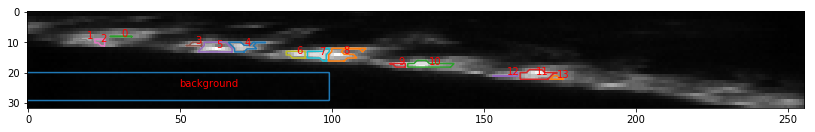

In [56]:
fig = plt.figure(figsize=(12,12))
ax1 = fig.add_axes([0.1, 0.1, 0.9, 0.9])
ax1.imshow(sum_image, cmap=plt.cm.gray)

for row, dseries in roi_df.iterrows():
    mask = np.zeros(sum_image.shape)
    mask = mask.flatten()
    mask[dseries['roi_index']]=1
    mask = mask.reshape(sum_image.shape)
    contours = measure.find_contours(mask, 0.9)
    for contour in contours:
        ax1.plot(contour[:,1], contour[:, 0])
    #label roi
    props=regionprops(mask.astype(np.int))
    ax1.text(props[0].centroid[1], props[0].centroid[0], str(row), color='r')

In [57]:
#determing the normalize fourier transfrom for each frequency
#https://www.oreilly.com/library/view/elegant-scipy/9781491922927/ch04.html
#https://ericstrong.org/fast-fourier-transforms-in-python/
sampling_rate = 1/image_speed
from scipy import fftpack
def normalized_fourier_transform(cdata):
        #cdata = intensity data over time
        #N = (end_time - start_time)*sampling_rate # array size
        #print('length of cdata', str(len(cdata)))
        N = len(cdata)
        X=fftpack.fft(cdata)
        #print('length of x:' + str(len(X)))
        y = 2/N * np.abs(X[0:np.int(N/2)]) # positive freqs only
        T = 1/sampling_rate # inverse of the sampling rate
        x = np.linspace(0.0, 1.0/(2.0*T), int(N/2))
        #print('x length:', str(len(x)))
        #print('y length:', str(len(y)))
        y = np.abs(y)/np.sum(np.abs(y))
        return x, y

In [58]:
print('Fourier transform (intensity - background) to determine the dominant frequency.')
data2 = defaultdict(list)
for row, dseries in roi_df.drop(['background']).iterrows():
    raw_data = np.array(dseries['raw']) - np.array(roi_df['raw'].loc['background'])
    freqs, X2 =  normalized_fourier_transform(raw_data)
    data2['frequency'].append(freqs)
    data2['transform'].append(X2)
    data2['roi'].append(row)
    data2['color'].append(dseries['Color'])

    
legend_it = []
#p = figure(plot_width=1000, plot_height=500, y_range=Range1d(min1, max1*1.2), x_range = Range1d(-0.1, 10), x_axis_label = 'Frequency (Hz)', y_axis_label = 'Normalized Fourier Spectrum')
p = figure(plot_width=1000, plot_height=500, y_range=Range1d(0, 0.1), x_range = Range1d(-0.1, 10), x_axis_label = 'Frequency (Hz)', y_axis_label = 'Normalized Fourier Spectrum')
p.title.text = 'Stimulation Fequency: ' + str(frequency_tested) + ' Hz'
source = ColumnDataSource(data2)
p.multi_line(xs='frequency', ys = 'transform', legend = 'roi', line_color = 'color', hover_line_color = 'color',  hover_line_alpha=1.0, line_alpha=0.6, source=source)

#add a line showing where stimulation occurred
stim_time = Span(location = frequency_tested, dimension='height', line_color = 'black', line_dash='dashed', line_width=2, line_alpha=0.5)
p.add_layout(stim_time)
p.add_tools(HoverTool(show_arrow=False, line_policy='next', tooltips=[
    ('roi', '@roi'),
]))
#legend = Legend(location=(0, 0))
legend.click_policy="hide"
#p.add_layout(legend, 'right')
show(p)
fourier_df = pd.DataFrame(data2)
fourier_df = fourier_df.set_index(fourier_df['roi'].values)

Fourier transform (intensity - background) to determine the dominant frequency.


In [59]:
#combine max deltaF/F and maximum fourier transform at frequency_tested hz
data1 = roi_df.drop(['background'])
maxFreq = {}
target_freq = frequency_tested
buffer_freq = 0.5
for row, dseries in roi_df.drop(['background']).iterrows():
    frequency = fourier_df['frequency'].loc[row]
    transform = fourier_df['transform'].loc[row]
    start_freq =  np.where(frequency > target_freq - buffer_freq)[0][0]#need to find where
    stop_freq = np.where(frequency > target_freq + buffer_freq)[0][0]
    target_transform = transform[start_freq: stop_freq]
    maxFreq[row] = np.max(target_transform)
maxFreq_df = pd.DataFrame.from_dict(data=maxFreq, orient = 'index', columns = ['max_freq'])
data3 = pd.concat([data1, maxFreq_df], axis=1)
data3['roi'] = data3.index

graph_buffer_min = 0.8
graph_buffer_max = 1.2
#create figure
p = figure(plot_width=1000, plot_height=500, y_range=Range1d(np.min(data3['Mean(Max)'].values)*graph_buffer_min, np.max(data3['Mean(Max)'].values)*graph_buffer_max), x_range = Range1d(np.min(data3['max_freq'].values)*graph_buffer_min, np.max(data3['max_freq'].values)*graph_buffer_max), x_axis_label = 'Max Freq', y_axis_label = 'Max DeltaF/F')
p.title.text = 'Stimulation Fequency: ' + str(frequency_tested) + ' Hz'
source = ColumnDataSource(data3)
p.scatter(x='max_freq', y = 'Mean(Max)', color = 'Color', hover_line_color = 'Color',  hover_line_alpha=1.0, line_alpha=0.6, source=source)
#p.scatter(x=data3['max_freq'].values, y=data3['Mean(Max)'].values)
#p.scatter(x=1,2,3, y=data3['Mean(Max)'].values)

p.add_tools(HoverTool(show_arrow=False, line_policy='next', tooltips=[
    ('roi', '@roi'),
]))
#legend = Legend(location=(0, 0))
legend.click_policy="hide"
#p.add_layout(legend, 'right')
show(p)


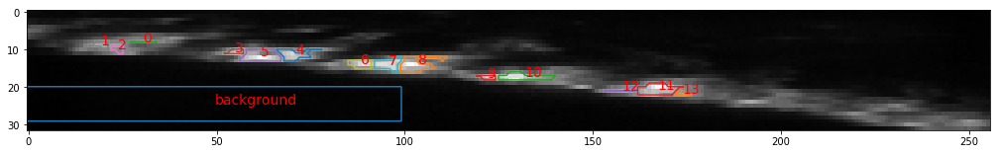

In [60]:
fig = plt.figure(figsize=[15,15])
ax1 = fig.add_axes([0.1, 0.1, 0.9, 0.9])
ax1.imshow(sum_image, cmap=plt.cm.gray)

for row, dseries in roi_df.iterrows():
    mask = np.zeros(sum_image.shape)
    mask = mask.flatten()
    mask[dseries['roi_index']]=1
    mask = mask.reshape(sum_image.shape)
    contours = measure.find_contours(mask, 0.9)
    for contour in contours:
        ax1.plot(contour[:,1], contour[:, 0])
    #label roi
    props=regionprops(mask.astype(np.int))
    ax1.text(props[0].centroid[1], props[0].centroid[0], str(row), color='r', fontsize = 14)

In [61]:
#combine multiple rois into a single roi for analysis
combine_rois = [10,11,12,13]
#combine roi index
new_index =[]
for crois in combine_rois:
    new_index.append(roi_df['roi_index'].loc[crois])
new_index = np.hstack(new_index).flatten()
signal = np.zeros([image.shape[0]])
for layer in range(image.shape[0]):
    cimage = image[layer].flatten()
    signal[layer] = np.mean(cimage[new_index])

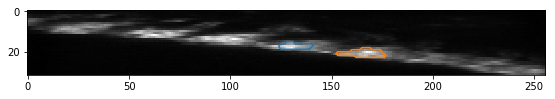

In [62]:
fig = plt.figure(figsize=(8,8))
ax1 = fig.add_axes([0.1, 0.1, 0.9, 0.9])
ax1.imshow(sum_image, cmap=plt.cm.gray)
ax1.axis('on')
mask = np.zeros(sum_image.shape)
mask = mask.flatten()
mask[new_index]=1
mask = mask.reshape(sum_image.shape)
contours = measure.find_contours(mask, 0.1)
for contour in contours:
    ax1.plot(contour[:,1], contour[:, 0])

In [63]:
#create a pandas dataframe to save data
output = pd.DataFrame(data = {'signal' : [signal, roi_df['signal'].loc['background']], 'roi_index' :[new_index, roi_df['roi_index'].loc['background'][0]]}, index = ['L2', 'Background'])

In [64]:
cdata = np.vstack(output['signal'].values)
min1 = np.min(cdata)
max1 = np.max(cdata)
p = figure(plot_width=1000, plot_height=400, y_range=Range1d(min1, max1), x_range = Range1d(0, np.max(time)), x_axis_label = 'Time (S)', y_axis_label = 'Intensity')
#plot showing voltage
p.extra_y_ranges = {"foo": Range1d(start=0, end=1)}
p.add_layout(LinearAxis(y_range_name='foo', axis_label = 'Volt (V)'), 'right')
#c = p.line(voltage.index[1::slice]/1000, np.squeeze(voltage.values[1::slice]), y_range_name = 'foo', line_color = (255,0, 0), line_alpha=0.5, line_width =2)
#drawing voltage as a line
#c = p.line(time,matched_voltage, y_range_name = 'foo', line_color = (255,0, 0), line_alpha=0.5, line_width =2)
#legend_it = [('Voltage', [c])]
#drawing voltage as box plots
legend_it =[]
for pt in stim_start_stops:
    stim_time = BoxAnnotation(left = time[pt[0]], right = time[pt[1]],  line_alpha=0.1 , fill_color = (255, 215, 0))
    p.add_layout(stim_time)

colors = {'L2':(0,255,0), 'Background':(0, 0, 255)}
for row, dseries in output.iterrows():
    c = p.line(x = time,  y = dseries['signal'], line_color = colors[row])
    legend_it.append((row, [c]))
legend = Legend(items = legend_it, location=(0, 100))
legend.click_policy="hide"
p.add_layout(legend, 'right')
show(p)

In [65]:
#pickle data because hdf is not working for an unknown reason
output2 = pd.DataFrame(data = [matched_voltage, signal.tolist(), roi_df['signal'].loc['background']], columns = time, index=['voltage', 'L2', 'Background'])
output_pickle =  str(img_folder / str('CROI_' + img_folder.parts[-1] + '.pckl'))
output2.to_pickle(output_pickle)


In [66]:
#save pandas dataframe including the index data
output3 = output['roi_index']
output_pickle =  str(img_folder / str('ROI-INDEX_' + img_folder.parts[-1] + '.pckl'))
output3.to_pickle(output_pickle)

In [67]:
#get a mean deltaF/F response for each roi
#find times when stim occurred == lights off
#subtract by -1 because diff places index on wrong number
#subtracting by 5 to account for delay in signa1
stim_times = np.where(np.diff(matched_voltage) < 0)[0] #-1
#print('stim points:', stim_times)


num_stims = frequency_tested * stim_duration -2 #number of stims included
stim_times = stim_times[1:num_stims]
#divide the data into test periods

timeStamp = np.arange(0, prestart + test) * image_speed
rawA = []
raw = []
for row, dseries in output.iterrows():
    cdata = dseries['signal']
    parsed = np.zeros([num_stims-1, prestart+test])
    for row, cstim in enumerate(stim_times[:num_stims]):
        parsed[row, :] = cdata[ cstim-prestart: cstim+test]
    raw.append(cdata[stim_times[0]: stim_times[-1]])
    rawA.append(parsed)
deltaFF = []
deltaFFMax = []
SNR = []
for cdata in rawA:
    df = fluorescent(cdata, parsed[-1], start = prestart, response = 'neg', timeStamp1 = timeStamp)
    deltaFF.append(df.deltaFF())
    deltaFFMax.append(df.Max())
    SNR.append(df.SNR())
output['DeltaF/F'] = deltaFF
output['Max'] = deltaFFMax
output['SNR'] = SNR   
output['Raw Intensity Aligned to Stim'] = rawA
output['raw'] = raw

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater


In [68]:

def color_gen():
    yield from itertools.cycle(Category20[10])
color = color_gen()

colors = []
for m, c in zip(range(len(output)), color):
    colors.append(c)
output['Color'] = colors


min2 = []
max2 = []
for row, dseries in output.drop(['Background']).iterrows():
    min2.append(np.nanmin(np.nanmean(dseries['DeltaF/F'], axis=0)))
    max2.append(np.nanmax(np.nanmean(dseries['DeltaF/F'], axis=0)))
min1 = np.nanmin(min2)
max1 = np.nanmax(max2)           


p = figure(plot_width=700, plot_height=400, y_range=Range1d(min1, max1), x_range = Range1d(0, np.max(timeStamp)), x_axis_label = 'Time (S)', y_axis_label = 'DeltaF/F')
#placing data in a diction for columnsourcedata
data2 = defaultdict(list)
legend_it = []
for row, dseries in output.drop(['Background']).iloc[0:15].iterrows():
    c = p.line(x = timeStamp, y = np.nanmean(dseries['DeltaF/F'], axis=0), line_color = dseries['Color'], line_alpha = 0.7)
    legend_it.append((str(row), [c]))   
stim_time = Span(location = prestart*image_speed, dimension='height', line_color = 'black', line_dash='dashed', line_width=2, line_alpha=0.5)
p.add_layout(stim_time)
legend = Legend(items = legend_it, location=(0, -25))
legend.click_policy="hide"
p.add_layout(legend, 'right')
show(p)

In [69]:
#get the max deltaFF as a sorted list
max1 = []
for row, dseries in output.iterrows():
    max1.append(np.nanmean(dseries['Max']))
output['Mean(Max)'] = max1
output = output.sort_values(by=['Mean(Max)'], ascending = False)
output['Mean(Max)']
#data

Background    0.980085
L2            0.245342
Name: Mean(Max), dtype: float64

In [70]:
print('Fourier transform (intensity - background) to determine the dominant frequency.')
data2 = defaultdict(list)
for row, dseries in output.drop(['Background']).iterrows():
    raw_data = np.array(dseries['raw']) - np.array(output['raw'].loc['Background'])
    freqs, X2 =  normalized_fourier_transform(raw_data)
    data2['frequency'].append(freqs)
    data2['transform'].append(X2)
    data2['roi'].append(row)
    data2['color'].append(dseries['Color'])

    
legend_it = []
#p = figure(plot_width=1000, plot_height=500, y_range=Range1d(min1, max1*1.2), x_range = Range1d(-0.1, 10), x_axis_label = 'Frequency (Hz)', y_axis_label = 'Normalized Fourier Spectrum')
p = figure(plot_width=1000, plot_height=500, y_range=Range1d(0, 0.1), x_range = Range1d(-0.1, 10), x_axis_label = 'Frequency (Hz)', y_axis_label = 'Normalized Fourier Spectrum')
p.title.text = 'Stimulation Fequency: ' + str(frequency_tested) + ' Hz'
source = ColumnDataSource(data2)
p.multi_line(xs='frequency', ys = 'transform', legend = 'roi', line_color = 'color', hover_line_color = 'color',  hover_line_alpha=1.0, line_alpha=0.6, source=source)

#add a line showing where stimulation occurred
stim_time = Span(location = frequency_tested, dimension='height', line_color = 'black', line_dash='dashed', line_width=2, line_alpha=0.5)
p.add_layout(stim_time)
p.add_tools(HoverTool(show_arrow=False, line_policy='next', tooltips=[
    ('roi', '@roi'),
]))
#legend = Legend(location=(0, 0))
legend.click_policy="hide"
#p.add_layout(legend, 'right')
show(p)
fourier_df = pd.DataFrame(data2, index=output.drop(['Background']).index)

Fourier transform (intensity - background) to determine the dominant frequency.


In [71]:
#combine max deltaF/F and maximum fourier transform at frequency_tested hz
data1 = output.drop(['Background'])
maxFreq = {}
target_freq = frequency_tested
buffer_freq = 0.5
for row, dseries in fourier_df.iterrows():
    frequency = fourier_df['frequency'].loc[row]
    transform = fourier_df['transform'].loc[row]
    start_freq =  np.where(frequency > target_freq - buffer_freq)[0][0]#need to find where
    stop_freq = np.where(frequency > target_freq + buffer_freq)[0][0]
    target_transform = transform[start_freq: stop_freq]
    maxFreq[row] = np.max(target_transform)
maxFreq_df = pd.DataFrame.from_dict(data=maxFreq, orient = 'index', columns = ['max_freq'])
data3 = pd.concat([data1, maxFreq_df], axis=1)
data3['roi'] = data3.index


print(data3[['Mean(Max)', 'max_freq']])

    Mean(Max)  max_freq
L2   0.245342  0.002994


In [72]:
!jupyter-nbconvert A75_QuickAssement.ipynb

[NbConvertApp] Converting notebook A75_QuickAssement.ipynb to html
[NbConvertApp] Writing 14458859 bytes to A75_QuickAssement.html
